In [184]:
import pandas as pd
import numpy as np
import difflib
import timeit
import matplotlib.pyplot as plt
import seaborn as sns
import os
%matplotlib inline

from sklearn import metrics
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

In [186]:
YEAR = 2020

if not os.path.exists(f'Данные_{YEAR}'):
    os.mkdir(f'Данные_{YEAR}')
    
os.chdir(f"/Users/denisenko/Desktop/Минэнерго/Отключения - выгрузка/Данные_{YEAR}")

# Загрузка

In [187]:
file_dir = f'/Users/denisenko/Desktop/Минэнерго/Отключения - выгрузка/Данные/Форма_8.1_(2020_год).xlsx'

df = pd.read_excel(file_dir, skiprows=0, header=1)

In [188]:
df.head(5)

,"Примененный фильтр:Год:2020; Нахождение в ДПР: Все ТСО; Отношение к ПАО ""Россети"": Все ТСО; Виды прекращений передачи электроэнергии: В и В1 и А;",Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 45,Unnamed: 46,Unnamed: 47,Unnamed: 48,Unnamed: 49,Unnamed: 50,Unnamed: 51,Unnamed: 52,Unnamed: 53,Unnamed: 54
0,Год,Месяц,id ТСО,Наименование ТСО,email,id Головной компании,Наименование Головной компании,id РЭК,Наименование РЭК,код Субъекта РФ,...,Код организационной причины аварии \n\n(п. 25 ...,Код технической причины повреждения оборудован...,"Учет в показателях надежности, в т.ч. индикати...",Отсутствует аналог в онлайн ведомости да/нет,Отсутствует аналог в корректирующей ведомости ...,запрошены подтверждающие документов да/нет,документы представлены да/нет/срок представлен...,отклонены подтверждающие документы да/нет,Код орг. причины 3.4.9.1 - смежн.СО да/нет,Код орг. причины 3.4.9.3 - потр.ЭУ да/нет
1,1,2,3,4,5,6,7,8,9,10,...,46,47,48,49,50,51,52,53,54,55
2,2020,2,2867,"Акционерное общество ""Башкирские электрические...",ao.bes@mail.ru,NaN,NaN,1001,Государственный комитет Республики Башкортоста...,02,...,3.4.14,4.21,1,нет,NaN,нет,не требуется,NaN,нет,нет
3,2020,3,2867,"Акционерное общество ""Башкирские электрические...",ao.bes@mail.ru,NaN,NaN,1001,Государственный комитет Республики Башкортоста...,02,...,3.4.10,4.4,1,нет,NaN,нет,не требуется,NaN,нет,нет
4,2020,4,2867,"Акционерное общество ""Башкирские электрические...",ao.bes@mail.ru,NaN,NaN,1001,Государственный комитет Республики Башкортоста...,02,...,3.4.12.5,4.7,1,нет,NaN,нет,не требуется,NaN,нет,нет


In [189]:
# Скопируем датасет
dfcop = df.copy()

# Обзор и приведение датасета 

In [190]:
dfcop.columns = dfcop.loc[0]
dfcop = dfcop[2:]

# Список колонок, которые несут полезную информацию
list_columns = [0,1,2,3,9,10,11,12,13,22,23,24,25,26,27,31,33,42,45,46]

In [191]:
# оставим только нужные колонки
dfcop = dfcop.iloc[:,list_columns]

In [192]:
new_columns_name = ['year',
 'month',
 'id_TSO',
 'name_TSO',
 'id_region',
 'region',
 'id_FO',
 'FO',
 'org_type_TSO',
 'name_unit',
 'object_type',
 'object_name',
 'max_voltage',
 'time_start',
 'time_finish',
 'duration_hour',
 'number_delivery_points',
 'total_amount_capacity',
 'code_org_reason',
 'code_tech_reason',
]

dfcop.columns = new_columns_name

In [193]:
dfcop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 233738 entries, 2 to 233739
Data columns (total 20 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   year                    233738 non-null  object
 1   month                   233738 non-null  object
 2   id_TSO                  233738 non-null  object
 3   name_TSO                233738 non-null  object
 4   id_region               233738 non-null  object
 5   region                  233738 non-null  object
 6   id_FO                   233589 non-null  object
 7   FO                      233589 non-null  object
 8   org_type_TSO            233738 non-null  object
 9   name_unit               233738 non-null  object
 10  object_type             233738 non-null  object
 11  object_name             233738 non-null  object
 12  max_voltage             233738 non-null  object
 13  time_start              233738 non-null  object
 14  time_finish             231363 non-n

In [194]:
dfcop['total_amount_capacity'].sum()

128418343.21999228

In [195]:
# меняем типы данных для отдельных колонок
dfcop[['year',
       'month',
       'id_TSO',
      'id_region',
      'number_delivery_points',
      ]] = dfcop[['year',
       'month',
       'id_TSO',
      'id_region',
      'number_delivery_points',
      ]].astype(int)

dfcop[['duration_hour','total_amount_capacity']] = dfcop[['duration_hour','total_amount_capacity']].astype(float)

In [196]:
dfcop['total_amount_capacity'].sum()

128418343.22000001

## Датасет с данными по ТСО (кол-во точек поставки)

In [197]:
url_83 = '/Users/denisenko/Desktop/Минэнерго/Отключения - выгрузка/Данные/Форма_8.3_(8).xlsx'

df_83 = pd.read_excel(url_83)

In [198]:
print('Количество записей в датасете = ', df_83.shape[0])
print('Количество уникальных id ТСО = ', df_83['id ТСО'].nunique())

Количество записей в датасете =  1684
Количество уникальных id ТСО =  1684


In [199]:
df_83_id = df_83[['id ТСО','Максимальное за расчетный период регулирования число точек поставки сетевой организации, шт.']]
df_83_id.columns = ['id_TSO','max_points']

In [200]:
df_83_id.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1684 entries, 0 to 1683
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   id_TSO      1684 non-null   int64  
 1   max_points  1572 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 26.4 KB


In [201]:
# df_83_id['max_points'].fillna(0,inplace=True)

In [202]:
df_83_id.isna().sum()

id_TSO          0
max_points    112
dtype: int64

In [203]:
# Замерджим два датасета
dfcop = dfcop.merge(df_83_id, how='left', on='id_TSO')

## Новые признаки и очистка

In [204]:
# Проведем некоторую очистку данных и приведение к удобному формату

# Добавим наименованиям объектов ID ТСОшек
dfcop['object_name'] = dfcop['object_name'].astype(str) +'_id_'+ dfcop['id_TSO'].astype(str)

dfcop['powerhour'] = dfcop['total_amount_capacity'] * dfcop['duration_hour']/1000

dfcop['powhour_per_points'] = dfcop['powerhour'] / dfcop['number_delivery_points']
dfcop['powhour_per_points'] = dfcop['powhour_per_points'].fillna(0)

dfcop['object_type'] = dfcop['object_type'].apply(lambda x: x.upper())

dfcop['code_org_reason'] = dfcop['code_org_reason'].apply(lambda x: str(x).replace(', ',',').replace(',',', '))

dfcop['code_tech_reason'] = dfcop['code_tech_reason'].apply(lambda x: str(x).replace(', ',',').replace(',',', '))

In [205]:
# Удалим строки, где нет данных по количеству точек поствки
dfcop.dropna(subset=['max_points'],inplace=True)

In [206]:
dfcop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 233227 entries, 0 to 233737
Data columns (total 23 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   year                    233227 non-null  int64  
 1   month                   233227 non-null  int64  
 2   id_TSO                  233227 non-null  int64  
 3   name_TSO                233227 non-null  object 
 4   id_region               233227 non-null  int64  
 5   region                  233227 non-null  object 
 6   id_FO                   233227 non-null  object 
 7   FO                      233227 non-null  object 
 8   org_type_TSO            233227 non-null  object 
 9   name_unit               233227 non-null  object 
 10  object_type             233227 non-null  object 
 11  object_name             233227 non-null  object 
 12  max_voltage             233227 non-null  object 
 13  time_start              233227 non-null  object 
 14  time_finish         

In [207]:
dfcop.nunique()

year                           1
month                         12
id_TSO                       933
name_TSO                     931
id_region                     82
region                        82
id_FO                          8
FO                             8
org_type_TSO                   1
name_unit                   5967
object_type                    6
object_name               165189
max_voltage                   17
time_start                147635
time_finish               155962
duration_hour               2169
number_delivery_points      3444
total_amount_capacity      19158
code_org_reason              361
code_tech_reason             279
max_points                   839
powerhour                  65308
powhour_per_points        129024
dtype: int64

Из странного:

1. Не совпадает кол-во id ТСО и наименований ТСО

2. Слишком много уникальных значений в кодах организационных и технических причин аварий.



## Дата и время

In [208]:
dfcop['time_start'] = pd.to_datetime(dfcop['time_start'])

dfcop['dayofweek'] = dfcop['time_start'].apply(lambda x: x.dayofweek)

dict_dayofweek = {0:'1.пн',
                 1:'2.вт',
                 2:'3.ср',
                 3:'4.чт',
                 4:'5.пт',
                 5:'6.сб',
                 6:'7.вс',}

dfcop['dayofweek'] = dfcop['dayofweek'].map(dict_dayofweek)

# dict_month = {1:'1.янв',
#                  2:'2.фев',
#                  3:'3.мар',
#                  4:'4.апр',
#                  5:'5.май',
#                  6:'6.июн',
#                  7:'7.июл',
#              8:'8.авг',
#              9:'9.сен',
#              10:'10.окт',
#              11:'11.ноя',
#              12:'12.дек',}

# dfcop['month'] = dfcop['month'].map(dict_month)

dfcop['start_hour'] = dfcop['time_start'].apply(lambda x: x.hour)

In [209]:
dfcop.head(3)

,year,month,id_TSO,name_TSO,id_region,region,id_FO,FO,org_type_TSO,name_unit,...,duration_hour,number_delivery_points,total_amount_capacity,code_org_reason,code_tech_reason,max_points,powerhour,powhour_per_points,dayofweek,start_hour
0,2020,2,2867,"Акционерное общество ""Башкирские электрические...",2,Башкортостан,8,Приволжский ФО,ТСО,АО БЭС,...,0.50,1,14.0,3.4.14,4.21,1087.0,0.00700,0.00700,5.пт,13
1,2020,3,2867,"Акционерное общество ""Башкирские электрические...",2,Башкортостан,8,Приволжский ФО,ТСО,АО БЭС,...,1.73,0,0.0,3.4.10,4.4,1087.0,0.00000,0.00000,1.пн,13
2,2020,4,2867,"Акционерное общество ""Башкирские электрические...",2,Башкортостан,8,Приволжский ФО,ТСО,АО БЭС,...,0.53,9,9.0,3.4.12.5,4.7,1087.0,0.00477,0.00053,1.пн,7


In [210]:
# Очистка наименований регионов
dfcop['region'] = dfcop['region'].apply(lambda x: x.replace(' /','-').replace('/','').replace(' -',''))

# Обобщенная аналитика

### По ФО

In [26]:
# # Наибольшая общая длительность отключений по ФО
# display(dfcop.groupby('FO')['duration_hour'].sum().sort_values(ascending=False))

# fig1, ax1 = plt.subplots()
# explode = (0.1, 0.1, 0, 0,0,0,0,0)
# ax1.pie(dfcop.groupby('FO')['duration_hour'].sum().sort_values(ascending=False),
#         labels=dfcop.groupby('FO')['duration_hour'].sum().sort_values(ascending=False).index, 
#         explode = explode,
#         autopct='%1.1f%%',
#         shadow=True, startangle=90)
# ax1.axis('equal')
# ax1.set_title('Доля ФО по суммарной длительности отключений')
# plt.show()

In [27]:
# # Наибольшее количество отключений по ФО
# display(dfcop.groupby('FO')['duration_hour'].count().sort_values(ascending=False))

# fig1, ax1 = plt.subplots()
# explode = (0.1, 0.1, 0, 0,0,0,0,0)
# ax1.pie(dfcop.groupby('FO')['duration_hour'].count().sort_values(ascending=False),
#         labels=dfcop.groupby('FO')['duration_hour'].count().sort_values(ascending=False).index,
#         explode = explode,
#         autopct='%1.1f%%',
#         shadow=True, startangle=90)
# ax1.axis('equal')
# ax1.set_title('Доля ФО по общему количеству отключений')
# plt.show()

### Исследование ФО по регионам

In [28]:
# # Функция, чтоб глянуть, распределение субъектов в рамках одного ФО
# def stat_by_FO(FO):
#     #display(dfcop[dfcop['FO'] == FO].groupby('region')['duration_hour'].count().sort_values(ascending=False))

#     fig1, (ax1,ax2) = plt.subplots(2, 1, sharey=False, figsize=(10, 15))
#     fig1
#     #explode = (0.1, 0.1, 0, 0,0,0,0,0)
#     ax1.pie(dfcop[dfcop['FO'] == FO].groupby('region')['duration_hour'].count().sort_values(ascending=False),
#             labels=dfcop[dfcop['FO'] == FO].groupby('region')['duration_hour'].count().sort_values(ascending=False).index,

#             autopct='%1.1f%%',
#             shadow=True, startangle=90)
#     ax1.axis('equal')
#     ax1.set_title(f'Распределение субъектов в {FO} по количеству отключений\n')
# #    plt.show()
    
# #    fig2, ax2 = plt.subplots()
#     #explode = (0.1, 0.1, 0, 0,0,0,0,0)
#     ax2.pie(dfcop[dfcop['FO'] == FO].groupby('name_TSO')['duration_hour'].count()[:10].sort_values(ascending=False),
#             labels=dfcop[dfcop['FO'] == FO].groupby('name_TSO')['duration_hour'].count()[:10].sort_values(ascending=False).index,

#             autopct='%1.1f%%',
#             shadow=True, startangle=90)
#     ax2.axis('equal')
#     ax2.set_title(f'ТОП 10 ТСО в {FO} по количеству отключений\n\n')
    
#     fig1.savefig(f'Распределение регионов в {FO}')
#     plt.show()

In [29]:
#stat_by_FO('Приволжский ФО')

In [30]:
#stat_by_FO('Центральный ФО')

### ТОП 10 регионов по общей сумме отключений

In [211]:
dfcop.columns

Index(['year', 'month', 'id_TSO', 'name_TSO', 'id_region', 'region', 'id_FO',
       'FO', 'org_type_TSO', 'name_unit', 'object_type', 'object_name',
       'max_voltage', 'time_start', 'time_finish', 'duration_hour',
       'number_delivery_points', 'total_amount_capacity', 'code_org_reason',
       'code_tech_reason', 'max_points', 'powerhour', 'powhour_per_points',
       'dayofweek', 'start_hour'],
      dtype='object')

#### Строим отдельный датафрейм для исследования регионов

In [212]:

df_region = pd.DataFrame()

# Регион
df_region['id_region'] = dfcop.groupby('region')['id_region'].mean()

# год
df_region['year'] = dfcop.groupby('region')['year'].first()

# Количество отключений по регионам
df_region['shotdown_count'] = dfcop.groupby('region')['duration_hour'].count()

# Суммарная отключенная мощность
df_region['sum_power'] = dfcop.groupby('region')['total_amount_capacity'].sum()

# Суммарный недоотпуск
df_region['powerhour'] = dfcop.groupby('region')['powerhour'].sum()

# Недоотпуск на 1 нарушение
df_region['powhour/acc'] = df_region['powerhour'] / df_region['shotdown_count']

# Суммарная продолжительность отключений
df_region['sum_duration_hour'] = dfcop.groupby('region')['duration_hour'].sum()

# Длительность устранения на 1 нарушение
df_region['duration/acc'] = df_region['sum_duration_hour'] / df_region['shotdown_count']

df_region.reset_index(inplace=True)

In [213]:
df_region.head(2)

,region,id_region,year,shotdown_count,sum_power,powerhour,powhour/acc,sum_duration_hour,duration/acc
0,Алтай,4,2020,325,85332.38,91.653609,0.282011,398.51,1.226185
1,Алтайский,22,2020,4249,1901698.04,2614.008850,0.615206,5974.56,1.406110


In [214]:
# Подгружаем таблицу населения по регионам
pop = pd.read_excel('/Users/denisenko/Desktop/Минэнерго/Отключения - выгрузка/population.xlsx')
pop = pop.dropna()

pop['id_region'] = pop['id_region'].astype(int)

In [215]:
type(pop['id_region'][0])

numpy.int64

In [216]:
# добавляем к датасету данные по населению в регионах
df_region = df_region.merge(pop[['population_2020','id_region']], how='left', on='id_region')

# убираем строку с ФСК (Россия)
df_region = df_region[~df_region['population_2020'].isna() == True] 

# кол-во отключений на 1 человека * 1000
df_region['shotdown/pop*1000'] = (df_region['shotdown_count'] / df_region['population_2020'])*1000

# недоотпуск ЭЭ за год на 1 человека
df_region['powhour/pop'] = df_region['powerhour'] / df_region['population_2020']

# суммарная продолжительность отключений на 1 человека
df_region['duration/pop*100'] = (df_region['sum_duration_hour'] / df_region['population_2020'])*100

In [217]:
df_region.sort_values('powhour/pop', ascending=False).head(3)

,region,id_region,year,shotdown_count,sum_power,powerhour,powhour/acc,sum_duration_hour,duration/acc,population_2020,shotdown/pop*1000,powhour/pop,duration/pop*100
52,Приморский,25,2020,9059,39075445.28,34964.291812,3.859619,43515.77,4.803595,1895305,4.779706,0.018448,2.295977
56,Самарская,63,2020,2363,1189206.53,53421.442722,22.607466,4905.45,2.075942,3179026,0.743309,0.016804,0.154307
75,Хабаровский,27,2020,1887,4193221.72,12534.265293,6.642430,6790.25,3.598437,1315310,1.434643,0.009530,0.516247


#### heatmap

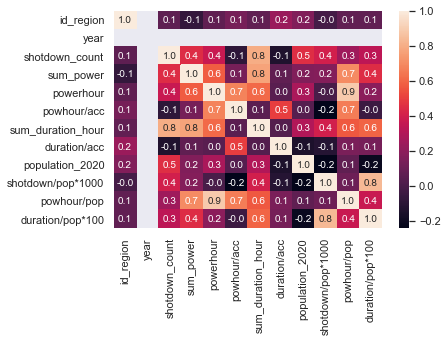

In [218]:
sns.heatmap(df_region.corr(),annot=True, fmt='.1f')

In [219]:
if not os.path.exists(f'ТОПы{YEAR}'):
    os.mkdir(f'ТОПы{YEAR}')

In [220]:
df_region.sort_values('powhour/pop', ascending=False).to_excel(f"ТОПы{YEAR}/TOP_regions.xlsx")

### ТОП 10 ТСО - по длительности устранения

In [221]:
 dfcop.columns

Index(['year', 'month', 'id_TSO', 'name_TSO', 'id_region', 'region', 'id_FO',
       'FO', 'org_type_TSO', 'name_unit', 'object_type', 'object_name',
       'max_voltage', 'time_start', 'time_finish', 'duration_hour',
       'number_delivery_points', 'total_amount_capacity', 'code_org_reason',
       'code_tech_reason', 'max_points', 'powerhour', 'powhour_per_points',
       'dayofweek', 'start_hour'],
      dtype='object')

#### Строим датафрейм для исследования ТСО

In [222]:
df_TSO = pd.DataFrame()

# Регион
df_TSO['region'] = dfcop.groupby('name_TSO')['region'].first()

# ТСО
df_TSO['id_region'] = dfcop.groupby('name_TSO')['id_region'].mean().astype(int)

# год
df_TSO['year'] = dfcop.groupby('name_TSO')['year'].first()

# Максимальное количество точек поствки
df_TSO['max_points'] = dfcop.groupby('name_TSO')['max_points'].mean()
df_TSO['max_points'] = df_TSO['max_points'].astype(int)

# Количество отключений
df_TSO['shotdown_count'] = dfcop.groupby('name_TSO')['duration_hour'].count()

# Суммарная продолжительность отключений
df_TSO['sum_duration_hour'] = dfcop.groupby('name_TSO')['duration_hour'].sum()

# Суммарная отключенная мощность
df_TSO['sum_power'] = dfcop.groupby('name_TSO')['total_amount_capacity'].sum()

# Суммарный недоотпуск
df_TSO['powerhour'] = dfcop.groupby('name_TSO')['powerhour'].sum()

# Количество отключений / количество точек поствки
df_TSO['shotdown_count/max_points'] = df_TSO['shotdown_count'] / df_TSO['max_points']

# Суммарная продолжительность отключений / количество точек поствки
df_TSO['sum_duration_hour/max_points'] = df_TSO['sum_duration_hour'] / df_TSO['max_points']

# Суммарный недоотпуск / количество точек поствки
df_TSO['powhour/max_points'] = df_TSO['powerhour'] / df_TSO['max_points']

In [223]:
df_TSO = df_TSO.reset_index()

In [224]:
df_TSO.sort_values('powerhour', ascending=False).head(2)

,name_TSO,region,id_region,year,max_points,shotdown_count,sum_duration_hour,sum_power,powerhour,shotdown_count/max_points,sum_duration_hour/max_points,powhour/max_points
366,"ОАО ""РЖД"" - СП ""Трансэнерго"" - Куйбышевская ди...",Самарская,63,2020,6110,146,524.28,640056.67,52206.098578,0.023895,0.085807,8.544370
306,"МУПВ ""Владивостокское предприятие электрически...",Приморский,25,2020,42236,595,1173.15,35692317.57,26605.669532,0.014088,0.027776,0.629929


In [225]:
df_TSO.sort_values('powerhour', ascending=False).to_excel(f'ТОПы{YEAR}/TOP_TSO.xlsx')

### Распределение ТСО в регионах

In [226]:
# Необходимо сделать рейтинги ТСО по каждому региону. Сохраним их как эксельки

if not os.path.exists(f"ТСО регионов{YEAR}"):
    os.mkdir(f"ТСО регионов{YEAR}")

for reg in df_TSO['region'].unique():
    df_TSO[df_TSO['region']==reg].sort_values('shotdown_count/max_points', ascending=False).to_excel(f'ТСО регионов{YEAR}/ТСО_{reg}.xlsx')

### ТОП-20 оборудования по отключениям

In [227]:
# Запилим также отдельный датафрейм для анализа отключаемости оборудования

df_obj = pd.DataFrame()

df_obj['name_TSO'] = dfcop.groupby('object_name')['name_TSO'].first()

df_obj['region'] = dfcop.groupby('object_name')['region'].first()

df_obj['year'] = dfcop.groupby('object_name')['year'].first()

df_obj['id_region'] = dfcop.groupby('object_name')['id_region'].mean().astype(int)

df_obj['sum_power'] = dfcop.groupby('object_name')['total_amount_capacity'].sum()

df_obj['powerhour'] = dfcop.groupby('object_name')['powerhour'].sum()

df_obj['sum_duration_hour'] = dfcop.groupby('object_name')['duration_hour'].sum()

#df_obj['mean_duration_hour'] = df.groupby('object_name')['duration_hour'].mean()

df_obj['shotdown_count'] = dfcop.groupby('object_name')['duration_hour'].count()

#df_obj['mean_capacity'] = df.groupby('object_name')['total_amount_capacity'].mean()

df_obj['mean_duration_hour'] = df_obj['sum_duration_hour'] / df_obj['shotdown_count']

In [228]:
df_obj.sort_values('shotdown_count',ascending=False).head(4)

,name_TSO,region,year,id_region,sum_power,powerhour,sum_duration_hour,shotdown_count,mean_duration_hour
object_name,,,,,,,,,
"ВЛ 0,22 кВ ввод в здание_id_1651","ООО ""Энергетик"" г. Карабаново",Владимирская,2020,33,0.00,0.000000,50.20,68,0.738235
ВЛ-10 У-3_id_2437,"ООО ""РОСТЭКЭЛЕКТРОСЕТИ""",Краснодарский,2020,23,6238.37,12.989768,19.49,50,0.389800
ПС 110 кВ Южная_id_2161,"ПАО ""Россети Кубань""",Краснодарский,2020,23,120150.00,179.164300,242.14,48,5.044583
Ф1ПЭ_id_1940,"ОАО ""РЖД"" - СП ""Трансэнерго"" - Куйбышевская ди...",Башкортостан,2020,2,19200.00,0.831000,1.73,42,0.041190


In [229]:
df_obj.shape

(165189, 9)

In [230]:
df_obj.sort_values('shotdown_count',ascending=False).to_excel(f'ТОПы{YEAR}/TOP_objects.xlsx')

# Анализ по ТСО-шкам

## ТСО отлючения по времени / дням / месяцам

In [231]:
dfcop.columns

Index(['year', 'month', 'id_TSO', 'name_TSO', 'id_region', 'region', 'id_FO',
       'FO', 'org_type_TSO', 'name_unit', 'object_type', 'object_name',
       'max_voltage', 'time_start', 'time_finish', 'duration_hour',
       'number_delivery_points', 'total_amount_capacity', 'code_org_reason',
       'code_tech_reason', 'max_points', 'powerhour', 'powhour_per_points',
       'dayofweek', 'start_hour'],
      dtype='object')

#### Функции для визаулу анализа ТСО

In [232]:
# Какое оборудование отключается чаще всего

def TSO_object_name(TSO):
    fig3 = plt.figure(figsize=(14,7))
    sns.set(rc={'figure.figsize':(8,10)})

    ax_1 = fig3.add_subplot(1, 2, 1)

    sns.barplot(y=dfcop[dfcop['name_TSO'] == TSO]['object_name'].value_counts().index[:20], 
                x=dfcop[dfcop['name_TSO'] == TSO]['object_name'].value_counts().values[:20],
               color = 'g',
               orient='h', ax=ax_1, alpha=.8,)
    ax_1.set_title(f'Распределение оборудования по отключениям',fontsize=15)
    
    ax_2 = fig3.add_subplot(1, 2, 2)

    sns.barplot(y=dfcop[dfcop['name_TSO'] == TSO].groupby('object_name')['powerhour'].sum().sort_values(ascending=False).index[:20], 
                x=dfcop[dfcop['name_TSO'] == TSO].groupby('object_name')['powerhour'].sum().sort_values(ascending=False).values[:20],
               color = 'r',
               orient='h', ax=ax_2, alpha=.8,)
    ax_2.set_title(f'Распределение оборудования по недоотпуску ЭЭ',fontsize=15)
    
    fig3.tight_layout()
#    fig3.set_figwidth(20)
#    fig3.set_figheight(10)
#    fig3.savefig(f'Распределение оборудования по отключениям в {TSO}')
#    plt.show()
    return fig3

In [233]:
# Отключения во времени - время суток, дни недели, месяца
def TSO_stat_by_time(TSO):
    fig2 = plt.figure()
    plt.subplots_adjust(wspace=0, hspace=0.3)

    ax_1 = fig2.add_subplot(2, 1, 1)
    ax_2 = fig2.add_subplot(2, 1, 2)

    sns.set(rc={'figure.figsize':(15,4)})
    sns.heatmap(pd.pivot_table(dfcop[dfcop['name_TSO'] == TSO], 
                               values='month', 
                               index=['dayofweek'],
                               columns=['start_hour'], 
                               aggfunc='count',
                              ), annot=True,fmt='g',cbar=False, ax=ax_1)

    sns.set(rc={'figure.figsize':(8,4)})
    sns.barplot(x=dfcop[dfcop['name_TSO'] == TSO]['month'].value_counts().index, 
                y=dfcop[dfcop['name_TSO'] == TSO]['month'].value_counts().values,
               color = 'b', ax=ax_2
               )

    ax_1.set_title(f'Распределение отключений по времени суток и дням недели',
                   fontsize=15)
    ax_2.set_title(f'\n Распределение отключений по месяцам',
                   fontsize=15)

    fig2.set_figwidth(15)
    fig2.set_figheight(10)
    
    fig2.tight_layout()
#     fig2.savefig(f'Отключения в {TSO}')

#     plt.show()
    return fig2

## Проверка на "одинаковость" наименований

In [286]:
import difflib

# Функция проверки "одинаковости" строки
def similarity(s1, s2):
  normalized1 = s1.lower()
  normalized2 = s2.lower()
  matcher = difflib.SequenceMatcher(None, normalized1, normalized2)
  return matcher.ratio()

# Анализ по субъектам РФ

In [234]:
dfcop.columns

Index(['year', 'month', 'id_TSO', 'name_TSO', 'id_region', 'region', 'id_FO',
       'FO', 'org_type_TSO', 'name_unit', 'object_type', 'object_name',
       'max_voltage', 'time_start', 'time_finish', 'duration_hour',
       'number_delivery_points', 'total_amount_capacity', 'code_org_reason',
       'code_tech_reason', 'max_points', 'powerhour', 'powhour_per_points',
       'dayofweek', 'start_hour'],
      dtype='object')

### heatmap по недоотпуску

In [235]:
if not os.path.exists("Heatmap регионов"):
    os.mkdir("Heatmap регионов")

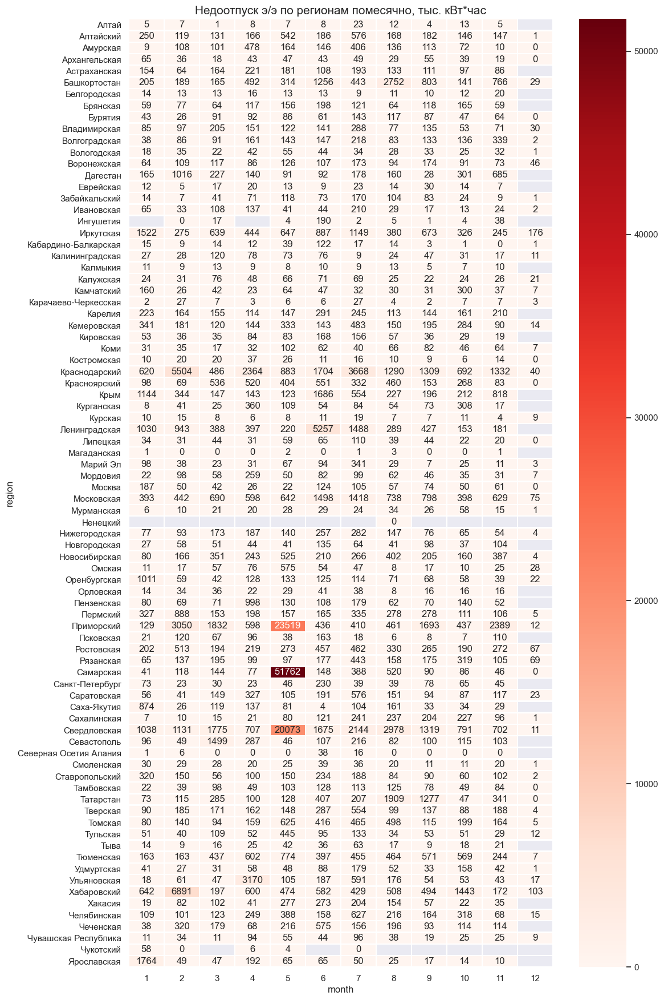

In [236]:
fig_h3 = plt.figure(figsize=(12,22), dpi= 100)
#sns.set(rc={'figure.figsize':(16,56)})

ax_h3 = fig_h3.add_subplot(1, 1, 1)

sns.heatmap(dfcop.pivot_table(
    index='region', 
    columns='month', 
    values='powerhour', 
    aggfunc=sum), 
            annot=True, fmt='.0f', annot_kws={'fontsize':12}, cmap='Reds', linewidths=1, ax=ax_h3)



ax_h3.set_title(f'Недоотпуск э/э по регионам помесячно, тыс. кВт*час',fontsize=15)

# fig_h3.set_figwidth(10)
# fig_h3.set_figheight(25)
fig_h3.savefig(f'Heatmap регионов/Недоотпуск_по_регионам_помесячно')
#plt.show()

### heatmap по количеству отключений

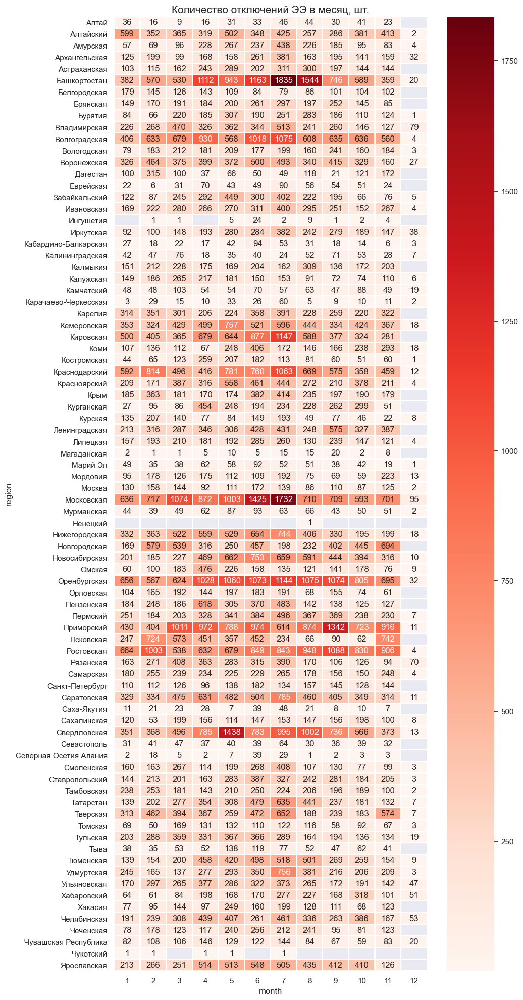

In [237]:
fig_h4 = plt.figure(figsize=(12,22), dpi= 100)
#sns.set(rc={'figure.figsize':(16,56)})

ax_h4 = fig_h4.add_subplot(1, 1, 1)

sns.heatmap(dfcop.pivot_table(
    index='region', 
    columns='month', 
    values='powerhour', 
    aggfunc='count'), 
            annot=True, fmt='.0f', annot_kws={'fontsize':12}, cmap='Reds', linewidths=1, ax=ax_h4)



ax_h4.set_title(f'Количество отключений ЭЭ в месяц, шт.',fontsize=15)

fig_h4.set_figwidth(10)
fig_h4.set_figheight(25)
fig_h4.savefig(f'Heatmap регионов/Количество_отключений_помесячно')
#plt.show()

In [238]:
df_region.columns

Index(['region', 'id_region', 'year', 'shotdown_count', 'sum_power',
       'powerhour', 'powhour/acc', 'sum_duration_hour', 'duration/acc',
       'population_2020', 'shotdown/pop*1000', 'powhour/pop',
       'duration/pop*100'],
      dtype='object')

## Кластеризация

Проведем кластеризацию регионов по относительным признакам

In [239]:
df_region_clstr = df_region[['shotdown/pop*1000','powhour/pop']]

df_region_clstr = StandardScaler().fit_transform(df_region_clstr)

#### KMean

In [240]:
# возьмем 3 кластера
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(df_region_clstr)
kmeans_pred_best = kmeans.labels_

unique, counts = np.unique(kmeans_pred_best, return_counts=True)
dict(zip(unique, counts))

{0: 72, 1: 4, 2: 6}

#### DBSCAN

In [241]:
dbscan = DBSCAN()

dbscan.fit(df_region_clstr)
unique, counts = np.unique(dbscan.labels_, return_counts=True)
dict(zip(unique, counts))

{-1: 12, 0: 70}

In [242]:
# Доавим лэйблы по итогам кластеризации
df_region['label_km'] = kmeans.labels_
df_region['label_db'] = dbscan.labels_

#### График Scatter на 1 чел

In [243]:
df_region.columns

Index(['region', 'id_region', 'year', 'shotdown_count', 'sum_power',
       'powerhour', 'powhour/acc', 'sum_duration_hour', 'duration/acc',
       'population_2020', 'shotdown/pop*1000', 'powhour/pop',
       'duration/pop*100', 'label_km', 'label_db'],
      dtype='object')

In [244]:
import plotly.express as px

In [245]:
df_region["label_km"] = df_region["label_km"].astype(str)

In [246]:
if not os.path.exists('Scatter регионов и ТСО'):
    os.mkdir('Scatter регионов и ТСО')

In [247]:
fig = px.scatter(df_region, 
                 x="shotdown/pop*1000", 
                 y="powhour/pop", 
                 color="label_km",
                 hover_data=['region'], title="Отключения электроэнергии в регионах РФ в 2020 году",
                size='duration/pop*100',
                 labels={
                     "shotdown/pop*1000": "Количество отключений на 1 чел.",
                     "powhour/pop": "Недоотпуск электроэнергии на 1 чел.",
                 })

fig.write_image("Scatter регионов и ТСО/Scatter_регионы_по_населению.pdf")
fig.show()

In [335]:
#Регионы из зеленой зоны:

# Регионы из группы 1 - наибольшие величины недоотпуска ЭЭ на 1 человека
print('Регионы из зеленой зоны')
print(list(df_region[df_region['label_km']=='1']['region']))
print('-'*20)
#Регионы из красной зоны:

# Регионы из группы 2 - наибольшее количество отклчений на 1 человека
print('Регионы из красной зоны')
print(list(df_region[df_region['label_km']=='2']['region']))

Регионы из зеленой зоны
['Приморский', 'Самарская', 'Свердловская', 'Хабаровский']
--------------------
Регионы из красной зоны
['Калмыкия', 'Карелия', 'Кировская', 'Новгородская', 'Оренбургская', 'Псковская']


Исходя из анализа регионов из зеленых и красных кластеров по абсолютным и относительным величинам, их можно объединить по территориальному признаку:

1. ДФО - Приморский,Хабаровский

2. ЮФО - Краснодарский,Волгоградская,Ростовская,Калмыкия

3. СКФО - Карелия,Новгородская,Псковская

4. ПФО, УФО - Башкортостан,Оренбургская,Самарская,Свердловская

# Исследование ключевых ТСО

Прежде всего сделаем новый датасет, где оставим только ТСО с кол-вом точек поставки больше 1000

In [250]:
df_TSO_short = df_TSO[df_TSO['max_points']>999]

In [251]:
print('Общее количество ТСО = ',df_TSO.shape[0])
print('Количество ТСО от 1000 точек поставки= ',df_TSO_short.shape[0])

Общее количество ТСО =  931
Количество ТСО от 1000 точек поставки=  576


#### Scatter по всем ТСО с нормировкой на кол-во точек поставки

In [252]:
df_TSO_short.columns

Index(['name_TSO', 'region', 'id_region', 'year', 'max_points',
       'shotdown_count', 'sum_duration_hour', 'sum_power', 'powerhour',
       'shotdown_count/max_points', 'sum_duration_hour/max_points',
       'powhour/max_points'],
      dtype='object')

Сперва забахаем кластеризацию

In [253]:

df_TSO_clstr = df_TSO_short[['shotdown_count/max_points','powhour/max_points']]

df_TSO_clstr = StandardScaler().fit_transform(df_TSO_clstr)

In [254]:
dbscan_2 = DBSCAN()

dbscan_2.fit(df_TSO_clstr)
unique, counts = np.unique(dbscan_2.labels_, return_counts=True)
dict(zip(unique, counts))

{-1: 13, 0: 563}

In [255]:
kmeans_2 = KMeans(n_clusters=3, random_state=42)
kmeans_2.fit(df_TSO_clstr)
kmeans_pred_best_2 = kmeans_2.labels_

unique, counts = np.unique(kmeans_pred_best_2, return_counts=True)
dict(zip(unique, counts))

{0: 543, 1: 1, 2: 32}

In [256]:
df_TSO_short['label_db'] = dbscan_2.labels_
df_TSO_short['label_km'] = kmeans_2.labels_

/Users/denisenko/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/denisenko/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [257]:
fig = px.scatter(df_TSO_short, 
                 x="shotdown_count/max_points", 
                 y="powhour/max_points",
                 size='sum_duration_hour/max_points',
                 color='label_db',
                 hover_data=['name_TSO'], title="Распределение ТСО по недоотпуску и количеству отключений на 1 точку поставки",
                 width=1000, height=600,
                 labels={
                     "shotdown_count/max_points": "Количество отключений на 1 точку поставки",
                     "powhour/max_points": "Недоотпуск электроэнергии на 1 точку поставки",
                 })


fig.write_image("Scatter регионов и ТСО/Scatter_ТСО_отн_показатели.pdf")
fig.show()

# size='max_points',

In [258]:
# ТСО, которые попали в выбросы
#df_TSO_short[df_TSO_short['label_db']!=0].to_excel('Худшие_ТСО.xlsx')

### Анализ ТСО по функциям

In [259]:
# for tso in list(df_terget_TSO['name_TSO'].unique()):
#     TSO_stat_by_time(tso)
#     TSO_object_name(tso)

In [260]:
dfcop[dfcop['region']=='Псковская']['name_TSO'].unique()

array(['АО "Оборонэнерго" - (Псковская обл)',
       'ПАО МРСК "Северо-Запада" - Псковский филиал',
       'Российские железные дороги'], dtype=object)

In [261]:
psc1, psc2, psc3 = list(dfcop[dfcop['region']=='Псковская']['name_TSO'].unique())

In [262]:
TSO_1 = 'ОАО "РЖД" - СП "Трансэнерго" - Куйбышевская дирекция по энергообеспечению (Самарская обл)'
TSO_2 = 'ОАО "РЖД" - СП "Трансэнерго" - Куйбышевская дирекция по энергообеспечению'
TSO_3 = 'Общество с ограниченной ответственностью "Объединённые региональные электрические сети Карелии" (ООО "ОРЭС-Карелия")'
TSO_4 = 'ООО Ноябрьскэнергонефть'

In [263]:
# Построим графики по искомым ТСО

# for tso in []:
#     TSO_stat_by_time(tso)
#     TSO_object_name(tso)

In [264]:
dfcop.columns

Index(['year', 'month', 'id_TSO', 'name_TSO', 'id_region', 'region', 'id_FO',
       'FO', 'org_type_TSO', 'name_unit', 'object_type', 'object_name',
       'max_voltage', 'time_start', 'time_finish', 'duration_hour',
       'number_delivery_points', 'total_amount_capacity', 'code_org_reason',
       'code_tech_reason', 'max_points', 'powerhour', 'powhour_per_points',
       'dayofweek', 'start_hour'],
      dtype='object')

#### Причины аварий организационные и технические

In [265]:
# Копия общей таблицы аварий
dfcop_dumm = dfcop.copy().reset_index(drop=True)

# Общие думмисы
tech_dumm = dfcop_dumm['code_tech_reason'].apply(lambda x: x.replace('0','').replace(' ','')).str.get_dummies(sep=',').reset_index(drop=True)
org_dumm = dfcop_dumm['code_org_reason'].apply(lambda x: x.replace('0','').replace(' ','')).str.get_dummies(sep=',').reset_index(drop=True)

In [267]:
print(tech_dumm.shape)
print(org_dumm.shape)

(233227, 20)
(233227, 35)


In [268]:
# Разделим наименование nan-колонок
tech_dumm = tech_dumm.rename(columns={'nan':'nan_tech'})
org_dumm = org_dumm.rename(columns={'nan':'nan_org'})

In [269]:
# конкатинируем общую таблицу и думмисы
dfcop_dumm = pd.concat([dfcop_dumm,tech_dumm],axis=1)
dfcop_dumm = pd.concat([dfcop_dumm,org_dumm],axis=1)

In [270]:
dfcop_dumm.shape

(233227, 80)

In [271]:
dfcop_dumm.columns

Index(['year', 'month', 'id_TSO', 'name_TSO', 'id_region', 'region', 'id_FO',
       'FO', 'org_type_TSO', 'name_unit', 'object_type', 'object_name',
       'max_voltage', 'time_start', 'time_finish', 'duration_hour',
       'number_delivery_points', 'total_amount_capacity', 'code_org_reason',
       'code_tech_reason', 'max_points', 'powerhour', 'powhour_per_points',
       'dayofweek', 'start_hour', '4.1', '4.11', '4.12', '4.13', '4.14',
       '4.15', '4.16', '4.17', '4.18', '4.19', '4.2', '4.21', '4.3', '4.4',
       '4.5', '4.6', '4.7', '4.8', '4.9', 'nan_tech', '3.4.1', '3.4.11',
       '3.4.12', '3.4.12.1', '3.4.12.2', '3.4.12.3', '3.4.12.4', '3.4.12.5',
       '3.4.13', '3.4.13.1', '3.4.13.2', '3.4.13.3', '3.4.13.4', '3.4.14',
       '3.4.2', '3.4.3', '3.4.4', '3.4.5', '3.4.6', '3.4.7', '3.4.7.1',
       '3.4.7.2', '3.4.7.3', '3.4.7.4', '3.4.8', '3.4.8.1', '3.4.8.2',
       '3.4.8.3', '3.4.8.4', '3.4.8.5', '3.4.9', '3.4.9.1', '3.4.9.2',
       '3.4.9.3', 'nan_org'],
      dtype

### Причины аварий для регионов РФ

In [272]:
# Словарь кодов причин

dict_reason = {'4.1':'4.1 Нарушение структуры материала', 
               '4.11':'4.11 Электродуговое повреждение', 
               '4.12':'4.12 Нарушение электрической изоляции', 
               '4.13':'4.13 Нарушение эл.контакта, размыкание, обрыв цепи', 
               '4.14':'4.14 Механическое разрушение ', 
               '4.15':'4.15 Разрушение фундамента', 
               '4.16':'4.16 Исчерпание ресурса',
               '4.17':'4.17 Загрязнение, попадание инородных предметов', 
               '4.18':'4.18 Дефект сварного соединения (шва)', 
               '4.19':'4.19 Повышение давления, гидравлический удар', 
               '4.2':'4.2 Механический износ, неудовл. смазка', 
               '4.21':'4.21 Невыявленные причины', 
               '4.3':'4.3 Нарушение механического соединения', 
               '4.4':'4.4 Внешнее механическое воздействие', 
               '4.5':'4.5 Золовой износ', 
               '4.6':'4.6 Коррозионный, эрозионный износ',
               '4.7':'4.7 Нарушение герметичности', 
               '4.8':'4.8 Нарушение нормального вибросостояния', 
               '4.9':'4.9 Взрыв, загорание, пожар',
               '3.4.1':'3.4.1 Ошибочные действия опер/дисп персонала', 
               '3.4.11':'3.4.11 Превышение параметров воздействия стихийных явлений относительно проекта', 
               '3.4.12':'3.4.12 Воздействие повторяющихся стихийных явлений',
               '3.4.12.1':'3.4.12.1 Гололедно-изморозевые отложения', 
               '3.4.12.2':'3.4.12.2 Ветровые нагрузки', 
               '3.4.12.3':'3.4.12.3 Атмосферные перенапряжения (гроза)', 
               '3.4.12.4':'3.4.12.4 Природные пожары', 
               '3.4.12.5':'3.4.12.5 Прочие воздействия неблагоприятных природных явлений', 
               '3.4.13':'3.4.13 Дефекты проекта, конструкции, изготовления, монтажа',
               '3.4.13.1':'3.4.13.1 Недостатки проекта', 
               '3.4.13.2':'3.4.13.2 Недостатки конструкции', 
               '3.4.13.3':'3.4.13.3 Дефекты изготовления', 
               '3.4.13.4':'3.4.13.4 Дефекты монтажа', 
               '3.4.14':'3.4.14 Невыявленные причины', 
               '3.4.2':'3.4.2 Ошибочные действия персонала служб организации',
               '3.4.3':'3.4.3 Ошибочные действия привлеченного по договору персонала', 
               '3.4.4':'3.4.4 Ошибочные действия собственного ремон./налад. персонала организации', 
               '3.4.5':'3.4.5 Ошибочные действия руководящего персонала', 
               '3.4.6':'3.4.6 Неудовлетворительное качество инструкций, документов организации', 
               '3.4.7':'3.4.7 Несоблюдение сроков/объемов ТО или ремонта оборудования и устройств', 
               '3.4.7.1':'3.4.7.1 Несоблюдение сроков ТО и ремонта оборудования, устройств', 
               '3.4.7.2':'3.4.7.2 Несоблюдение объемов ТО и ремонта оборудования, устройств',
               '3.4.7.3':'3.4.7.3 Несвоевременное выявление и устранение дефектов', 
               '3.4.7.4':'3.4.7.4 Прочие нарушения', 
               '3.4.8':'3.4.8 Воздействие посторонних лиц и организаций', 
               '3.4.8.1':'3.4.8.1 Несанкционированные работы в охранных зонах объектов ЭХ', 
               '3.4.8.2':'3.4.8.2 Проезд крупногабаритной техники', 
               '3.4.8.3':'3.4.8.3 Несанкционированная рубка лесных насаждений',
               '3.4.8.4':'3.4.8.4 Наброс посторонних предметов на ВЛ', 
               '3.4.8.5':'3.4.8.5 Прочие воздействия', 
               '3.4.9':'3.4.9 Воздействие организаций, участвующих в технологическом процессе', 
               '3.4.9.1':'3.4.9.1 Отключение оборудования в смежной электрической сети', 
               '3.4.9.2':'3.4.9.2 Отключение оборудования на объекте генерации', 
               '3.4.9.3':'3.4.9.3 Отключение оборудования потребителей электрической энергии',
               'nan_tech':'тех. причина не указана',
               'nan_org':'орг. причина не указана'

}

In [273]:
# DF - Технические причины аварий
reg_tech_reason = dfcop_dumm.groupby(['region'])[tech_dumm.columns].sum()

# DF - Организационные причины аварий
reg_org_reason = dfcop_dumm.groupby(['region'])[org_dumm.columns].sum()


In [274]:
# переименуем колонки, чтоб было красиво
reg_org_reason.columns = reg_org_reason.columns.map(dict_reason)
reg_tech_reason.columns = reg_tech_reason.columns.map(dict_reason)


In [275]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.io as pio

In [276]:

if not os.path.exists(f"ТОП причин аварий по регионам{YEAR}"):
    os.mkdir(f"ТОП причин аварий по регионам{YEAR}")

In [278]:
reg_org_reason.to_excel(f'ТОП причин аварий по регионам{YEAR}/Эксель_орг_прич_авар_регионов_{YEAR}.xlsx')
reg_tech_reason.to_excel(f'ТОП причин аварий по регионам{YEAR}/Эксель_тех_прич_авар_регионов_{YEAR}.xlsx')

### Диаграмма распределения причин аварий для региона

In [279]:
def graf_reg_reasons(region):
    # Create subplots: use 'domain' type for Pie subplot
    fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])

    fig.add_trace(go.Pie(labels = reg_org_reason.loc[region].sort_values(ascending=False)[:5].index,
                         values = reg_org_reason.loc[region].sort_values(ascending=False)[:5].values,
                         name="Организационные причины",
                        title = 'Организационные',
                        legendgroup="group1"), 1, 1)
    fig.add_trace(go.Pie(labels = reg_tech_reason.loc[region].sort_values(ascending=False)[:5].index,
                         values = reg_tech_reason.loc[region].sort_values(ascending=False)[:5].values,
                         name="Технические причины",
                        title = 'Технические',
                        legendgroup="group2"), 1, 2)

    # Use `hole` to create a donut-like pie chart
    fig.update_traces(hole=.55, hoverinfo="label+percent+name", textinfo='percent+value')

    fig.update_layout(
        title_text=f"ТОП-5 причин аварий: {region}",
        autosize=True,
        margin=dict(l=0, r=0, t=50, b=0),
        legend_orientation="h",
        legend=dict(x=.5, xanchor="center", font=dict(size=8))

        # Add annotations in the center of the donut pies.
    )
    #         annotations=[dict(text='Орг. причины', x=0.18, y=0.5, font_size=10, showarrow=False),
    #                  dict(text='Тех. причины', x=0.82, y=0.5, font_size=10, showarrow=False)]

#    fig.show()
    pio.write_image(fig, f'ТОП причин аварий по регионам{YEAR}/ТОП причин аварий {region}.pdf')

In [331]:
def graf_reg_reasons_bar(region):
    
    fig = make_subplots(rows=2, cols=1,)

    fig.add_trace(go.Bar(y = reg_org_reason.loc[region].sort_values(ascending=False)[:5].index,
                         x = reg_org_reason.loc[region].sort_values(ascending=False)[:5].values,
                         text = reg_org_reason.loc[region].sort_values(ascending=False)[:5].values,
                         name="Организационные причины",
                        orientation='h',
                        legendgroup="group1"), 1, 1)

    fig.add_trace(go.Bar(y = reg_tech_reason.loc[region].sort_values(ascending=False)[:5].index,
                         x = reg_tech_reason.loc[region].sort_values(ascending=False)[:5].values,
                         text = reg_tech_reason.loc[region].sort_values(ascending=False)[:5].values,
                         name="Технические причины",
                        orientation='h',
                        legendgroup="group2"), 2, 1)

    # Use `hole` to create a donut-like pie chart
    fig.update_traces(hoverinfo="text+name", texttemplate='%{text}', textposition='inside')

    fig.update_layout(
        title_text=f"ТОП-5 причин аварий: {region}",
        autosize=True,
        margin=dict(l=0, r=0, t=50, b=0),
        legend_orientation="h",
         uniformtext_mode='hide',
        legend=dict(x=.5, xanchor="center", font=dict(size=14)))

    pio.write_image(fig, f'Данные_{YEAR}/ТОП причин аварий по регионам{YEAR}/ТОП_bar причин аварий {region}.pdf')

In [332]:
for region in ['Калмыкия','Новгородская','Приморский','Самарская']:
    graf_reg_reasons_bar(region)

In [280]:
# Сохраним графики для целевых регионов
# for reg in []:
#     graf_reg_reasons(reg)

NameError: name 'list_target_reg' is not defined

## ф-я Регионы статистика по времени и дням недели

In [334]:
if not os.path.exists("Откл в рег по времени"):
    os.mkdir("Откл в рег по времени")

In [337]:
def graf_reg_stat_by_time(region):
    fig2_reg = plt.figure()
    plt.subplots_adjust(wspace=0, hspace=0.3)

    ax_1 = fig2_reg.add_subplot(2, 1, 1)
    ax_2 = fig2_reg.add_subplot(2, 1, 2)

    sns.set(rc={'figure.figsize':(15,4)})
    sns.heatmap(pd.pivot_table(dfcop[dfcop['region'] == region], 
                               values='month', 
                               index=['dayofweek'],
                               columns=['start_hour'], 
                               aggfunc='count',
                              ), annot=True,fmt='g',cbar=False, ax=ax_1)

    sns.set(rc={'figure.figsize':(8,4)})
    sns.barplot(x=dfcop[dfcop['region'] == region]['month'].value_counts().index, 
                y=dfcop[dfcop['region'] == region]['month'].value_counts().values,
               color = 'b', ax=ax_2
               )

    ax_1.set_title(f'Распределение отключений по времени и дням недели \n{region}',
                   fontsize=15)
    ax_2.set_title(f'\n Распределение отключений по месяцам \n{region}',
                   fontsize=15)

    fig2_reg.set_figwidth(15)
    fig2_reg.set_figheight(10)

    fig2_reg.savefig(f'Данные_{YEAR}/Откл в рег по времени/Отключения в {region}')

#    plt.show()

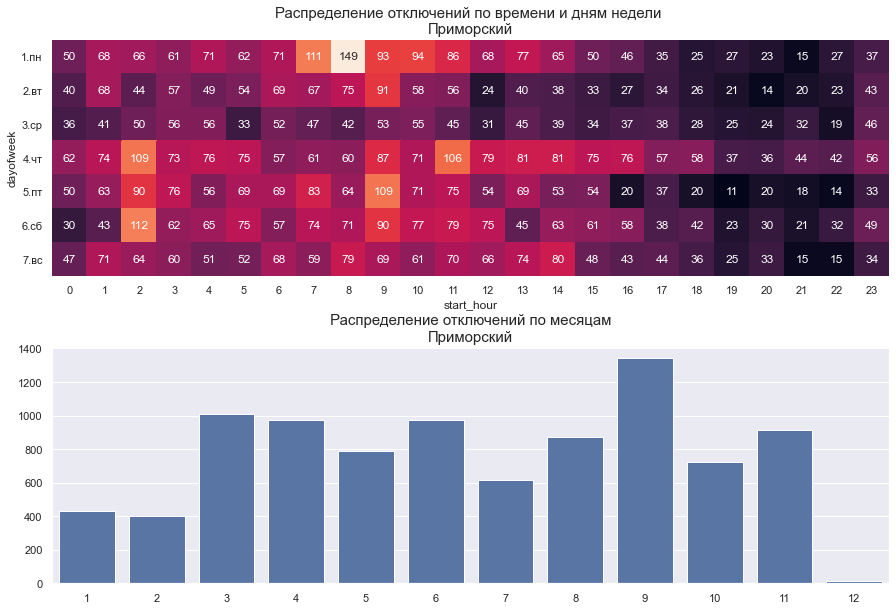

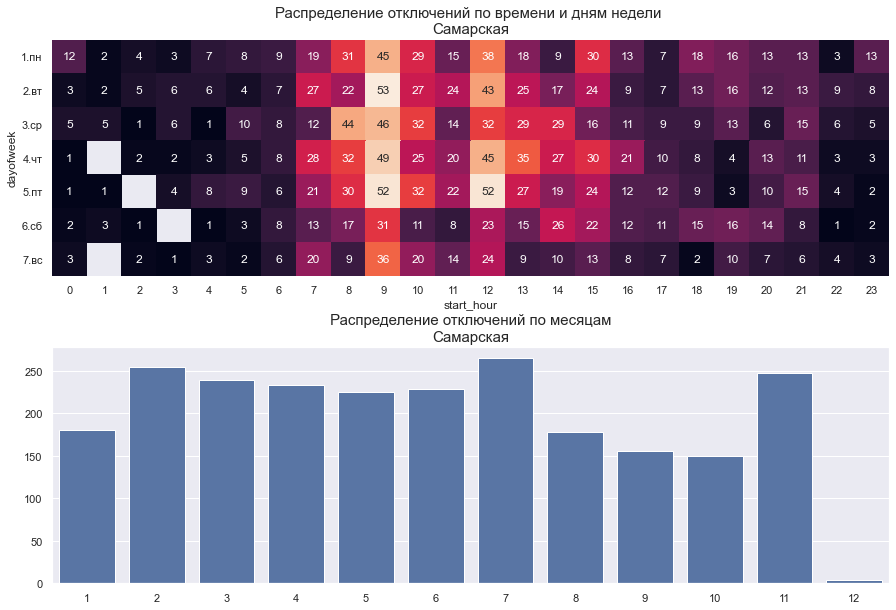

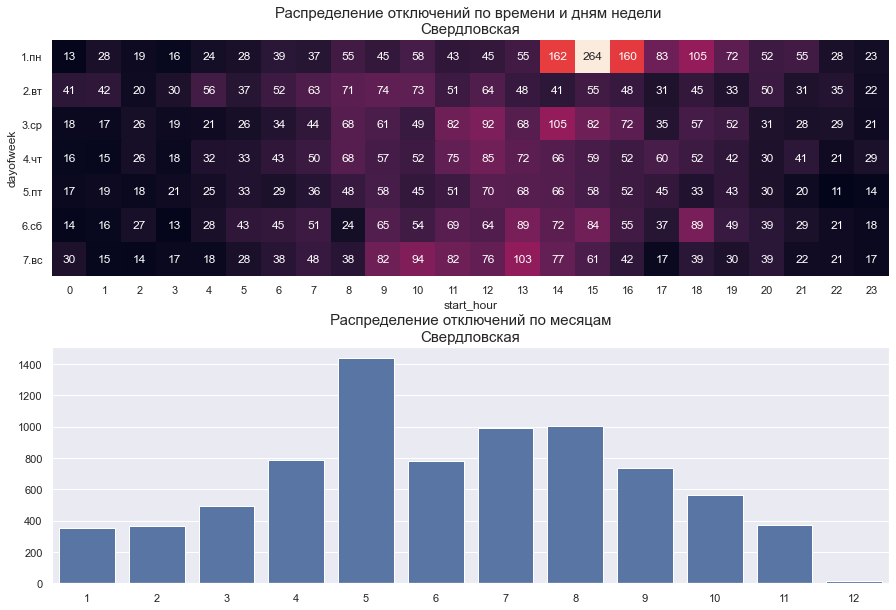

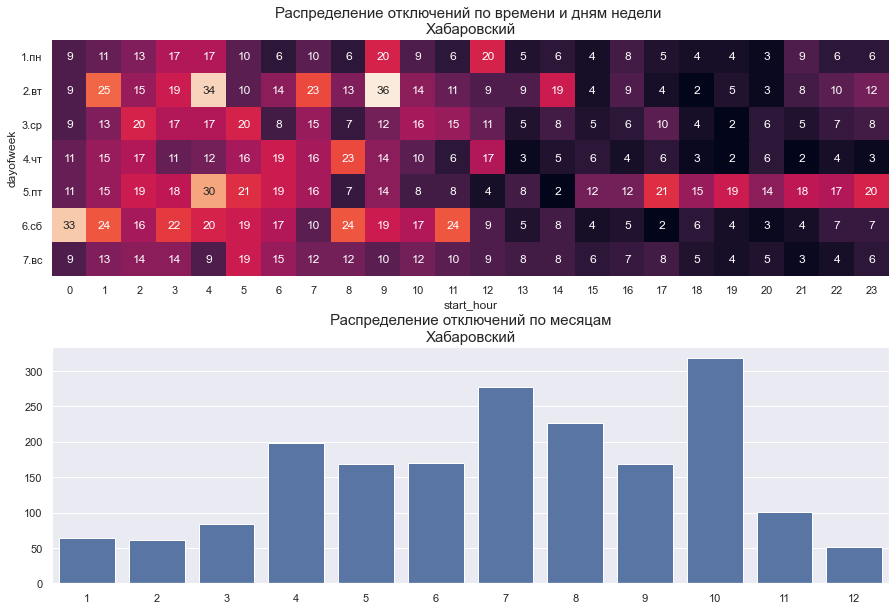

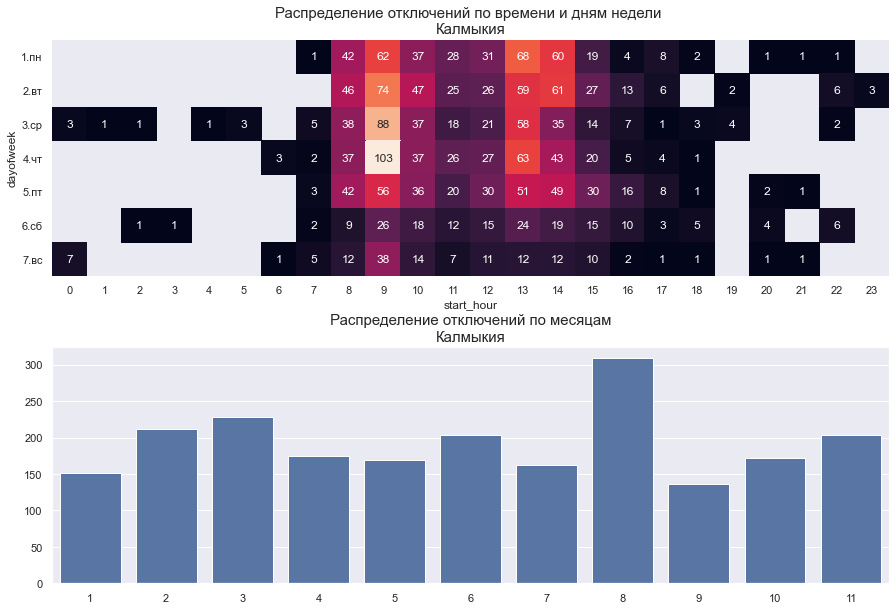

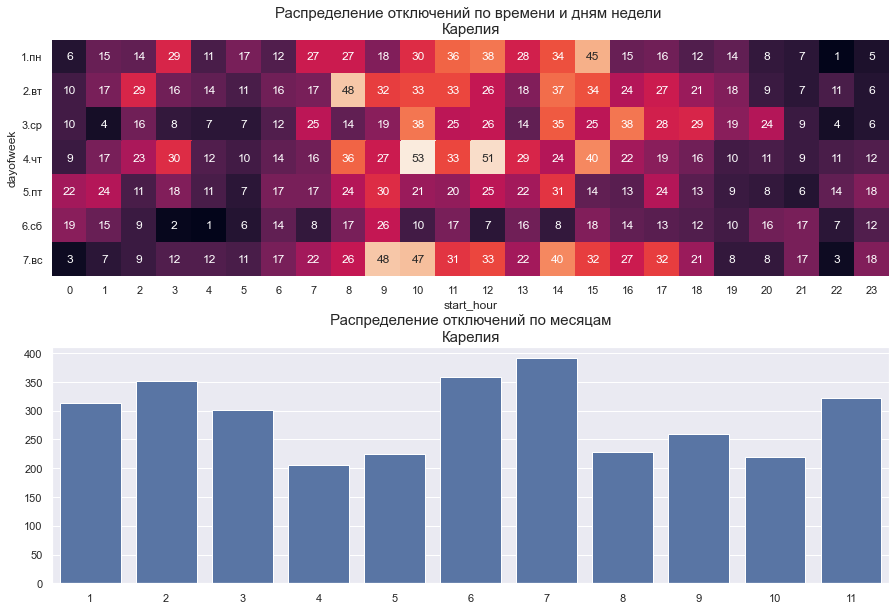

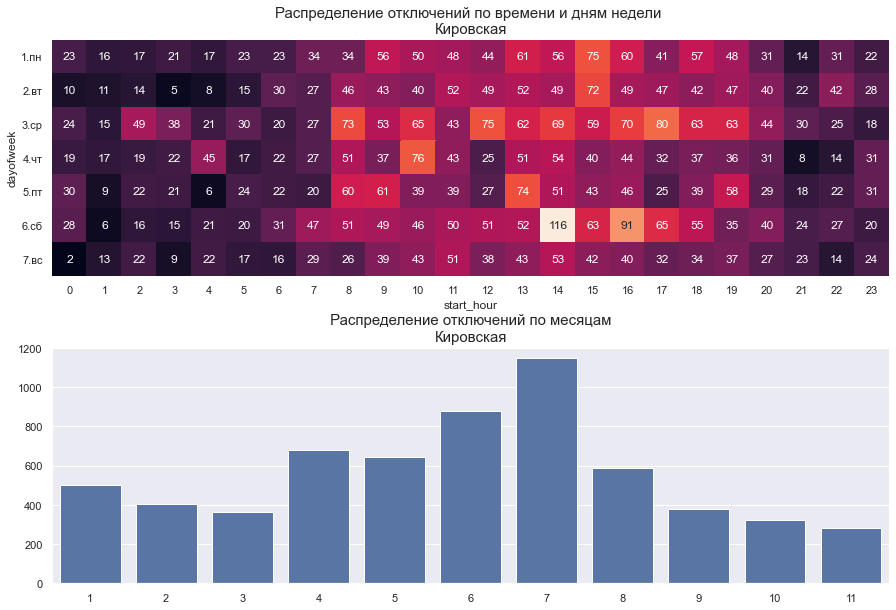

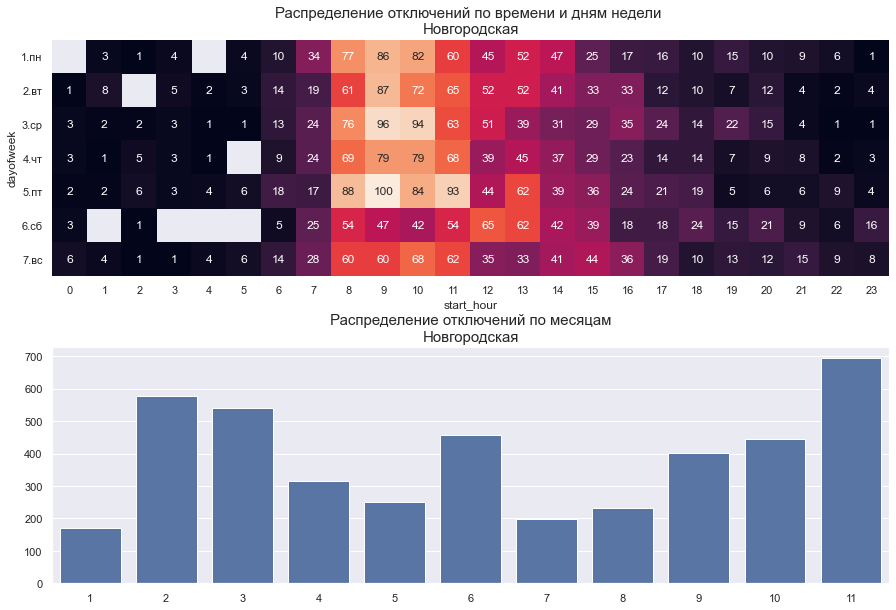

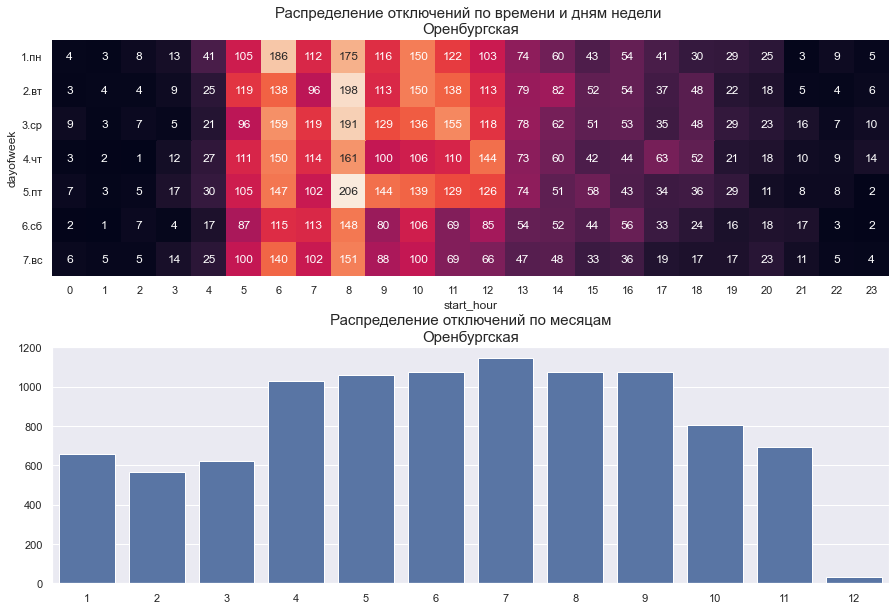

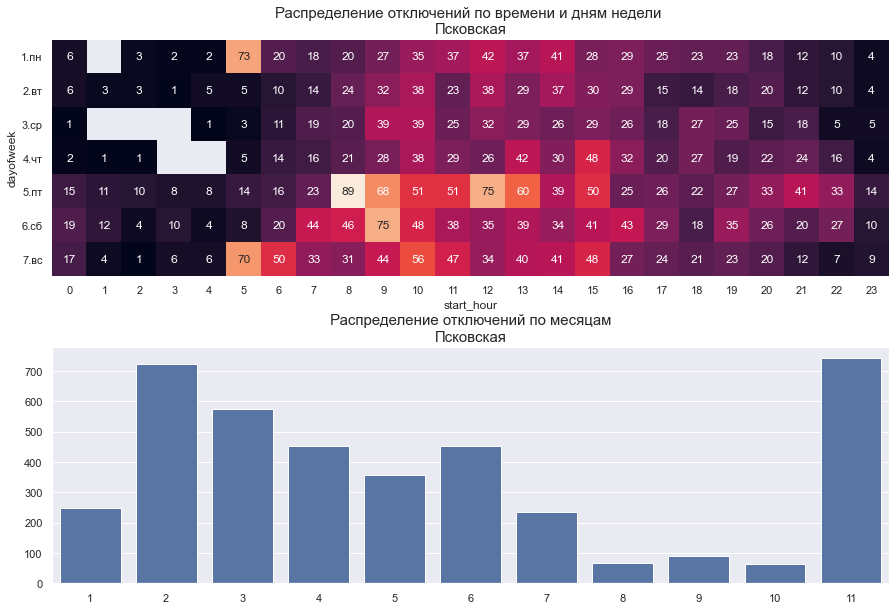

In [338]:
list_target_reg = list(df_region[df_region['label_km']=='1']['region']) + list(df_region[df_region['label_km']=='2']['region'])

# Сохраним графики для целевых регионов
for reg in list_target_reg:
    graf_reg_stat_by_time(reg)

### Статистика по отключениям ТСО

#### Эксель с данными по отключениям оборудования: кол-во откл, недоотпуск, причины отлключений

In [284]:
#org_dumm.columns.map(dict_reason)

In [285]:
def object_stat_table(TSO):
    # Таблица по авариям и недоотпуску оборудования ТСО
    Obj_TSO_transit = dfcop[dfcop['name_TSO']==TSO].groupby('object_name')[['powerhour']].agg(['count','sum'])
    Obj_TSO_transit['powerhour'] = Obj_TSO_transit['powerhour'].apply(lambda x: x.astype(int).round(1))

    # Конкатинируем признаки технических причин
    Obj_TSO_transit = pd.concat([Obj_TSO_transit,dfcop_dumm[dfcop_dumm['name_TSO']==TSO].groupby('object_name')[list(tech_dumm.columns)].sum()],axis=1)

    # Конкатинируем признаки организационных причин
    Obj_TSO_transit = pd.concat([Obj_TSO_transit,dfcop_dumm[dfcop_dumm['name_TSO']==TSO].groupby('object_name')[list(org_dumm.columns)].sum()],axis=1)

    # Удаляем столбцы, в которых все значения равны 0
    Obj_TSO_transit = Obj_TSO_transit.loc[:,(Obj_TSO_transit!=0).any(axis=0)]

    # Переименовываем колонки с причинами
    Obj_TSO_transit = Obj_TSO_transit.rename(columns=dict_reason)
    
    Obj_TSO_transit.reset_index(inplace=True)
    
    Obj_TSO_transit = Obj_TSO_transit.rename(columns={'object_name':'Наименование объекта',
                                                     'count':'Кол-во отключений',
                                                     'sum':'Суммарный недоотпуск'})
    
    Obj_TSO_transit['Наименование объекта'] = Obj_TSO_transit['Наименование объекта'].apply(lambda x: x[:x.find('_id_')])
    

    # Сохраняем таблицу
    # Obj_TSO_transit.to_excel(f'Стат_по_оборуд_{TSO}.xlsx')
    return Obj_TSO_transit

#### График ТОП-5 причин аварий

In [342]:
tso_1 = 'Общество с ограниченной ответственностью "Объединённые региональные электрические сети Карелии" (ООО "ОРЭС-Карелия")'
object_stat_table(tso_1).sum()

Наименование объекта                                            10/РП-1211/РП-1912/РП-1114/РП-1115/ТП-65016/РП...
(powerhour, count)                                                                                            225
(powerhour, sum)                                                                                               56
4.13 Нарушение эл.контакта, размыкание, обрыв цепи                                                             55
4.21 Невыявленные причины                                                                                     170
3.4.1 Ошибочные действия опер/дисп персонала                                                                    3
3.4.12.2 Ветровые нагрузки                                                                                      4
3.4.14 Невыявленные причины                                                                                    36
3.4.8 Воздействие посторонних лиц и организаций                                         

In [286]:
def graf_tso_reasons(tso):
    # Распределение организационных причин аварий
    org_reson_stat = object_stat_table(tso)
    org_reson_stat = org_reson_stat[set(org_reson_stat.columns)&set(org_dumm.columns.map(dict_reason))].sum().sort_values(ascending=False)

    # Распределение технических причин аварий
    tech_reson_stat = object_stat_table(tso)
    tech_reson_stat = tech_reson_stat[set(tech_reson_stat.columns)&set(tech_dumm.columns.map(dict_reason))].sum().sort_values(ascending=False)

    fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])

    fig.add_trace(go.Pie(labels = org_reson_stat.index[:5],
                         values = org_reson_stat.values[:5],
                         name="Организационные причины",
                        title = 'Организационные',
                        legendgroup="group1"), 1, 1)
    
    fig.add_trace(go.Pie(labels = tech_reson_stat.index[:5],
                         values = tech_reson_stat.values[:5],
                         name="Технические причины",
                        title = 'Технические',
                        legendgroup="group2"), 1, 2)

    # Use `hole` to create a donut-like pie chart
    fig.update_traces(hole=.55, hoverinfo="label+percent+name", textinfo='percent+value')

    fig.update_layout(
        title_text=f"ТОП-5 причин аварий: {tso}",
        autosize=True,
        margin=dict(l=0, r=0, t=50, b=0),
        legend_orientation="h",
        legend=dict(x=.5, xanchor="center", font=dict(size=8))

        # Add annotations in the center of the donut pies.
    )
    #         annotations=[dict(text='Орг. причины', x=0.18, y=0.5, font_size=10, showarrow=False),
    #                  dict(text='Тех. причины', x=0.82, y=0.5, font_size=10, showarrow=False)]

    #fig.show()
    #pio.write_image(fig, f'{tso}/ТОП_причин_аварий.pdf')
    return fig

#### Корелляция причин повреждений

In [287]:
def fig_corr_matrix(tso):
    test_df = object_stat_table(tso).iloc[:,3:].corr()

    test_df2 = test_df[(test_df > 0.7)].dropna(how='all').dropna(how='all',axis=1)

    fig_h4 = plt.figure(figsize=(10,10), dpi= 800)

    ax_h4 = fig_h4.add_subplot(1, 1, 1)

    sns.heatmap(test_df2, 
                annot=True, fmt='.2f', annot_kws={'fontsize':8}, cmap='Reds', linewidths=0.5, ax=ax_h4, cbar=False)

    ax_h4.set_title(f'Матрица корреляций причин отключений',fontsize=15)
    
    fig_h4.tight_layout()
    
    return fig_h4
    #return test_df2.round(2)
    #fig_h4.savefig(f'МК_причин_откл')
    #plt.show()

### Выгрузим основыне данные по ТСО в одноименные папки.

In [288]:
# Общее кол-во аварий

for tso in [TSO_1,TSO_2,TSO_3,TSO_4]:
    print(f'кол-во аварий {tso} =',dfcop[dfcop['name_TSO']==tso].shape[0])

    # Суммарный недоотпуск

    print(f'суммарный недоотпуск {tso} =',dfcop[dfcop['name_TSO']==tso]['powerhour'].sum())
    
    print('-'*12)

кол-во аварий ОАО "РЖД" - СП "Трансэнерго" - Куйбышевская дирекция по энергообеспечению (Самарская обл) = 146
суммарный недоотпуск ОАО "РЖД" - СП "Трансэнерго" - Куйбышевская дирекция по энергообеспечению (Самарская обл) = 52206.09857799999
------------
кол-во аварий ОАО "РЖД" - СП "Трансэнерго" - Куйбышевская дирекция по энергообеспечению = 292
суммарный недоотпуск ОАО "РЖД" - СП "Трансэнерго" - Куйбышевская дирекция по энергообеспечению = 3747.4772208000004
------------
кол-во аварий Общество с ограниченной ответственностью "Объединённые региональные электрические сети Карелии" (ООО "ОРЭС-Карелия") = 225
суммарный недоотпуск Общество с ограниченной ответственностью "Объединённые региональные электрические сети Карелии" (ООО "ОРЭС-Карелия") = 79.4591
------------
кол-во аварий ООО Ноябрьскэнергонефть = 352
суммарный недоотпуск ООО Ноябрьскэнергонефть = 121.49754000000001
------------


done for ОАО "РЖД" - СП "Трансэнерго" - Куйбышевская дирекция по энергообеспечению (Самарская обл)
done for ОАО "РЖД" - СП "Трансэнерго" - Куйбышевская дирекция по энергообеспечению
done for Общество с ограниченной ответственностью "Объединённые региональные электрические сети Карелии" (ООО "ОРЭС-Карелия")
done for ООО Ноябрьскэнергонефть


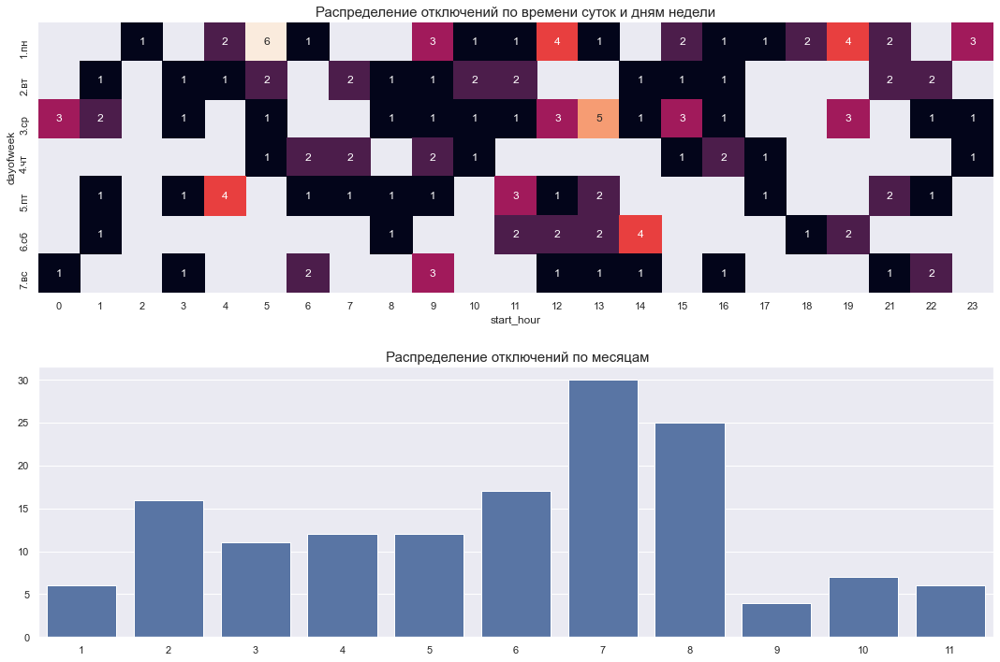

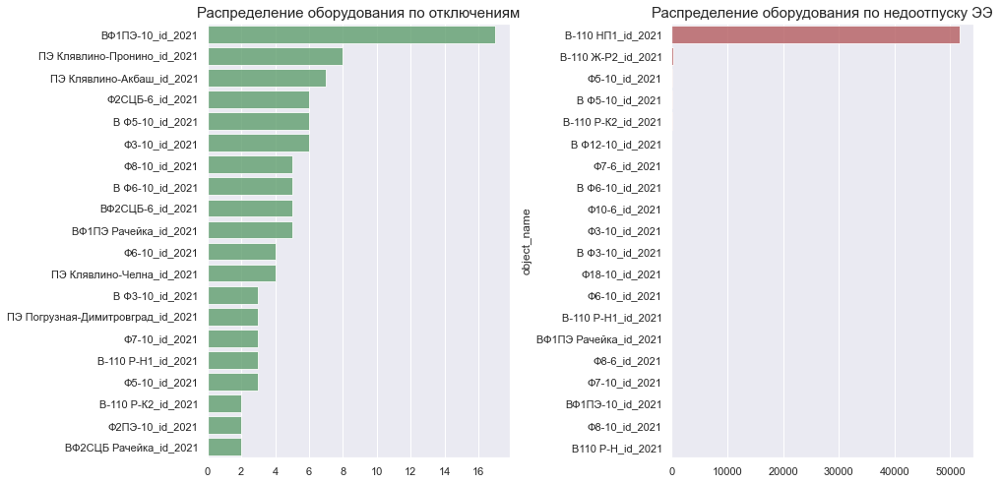

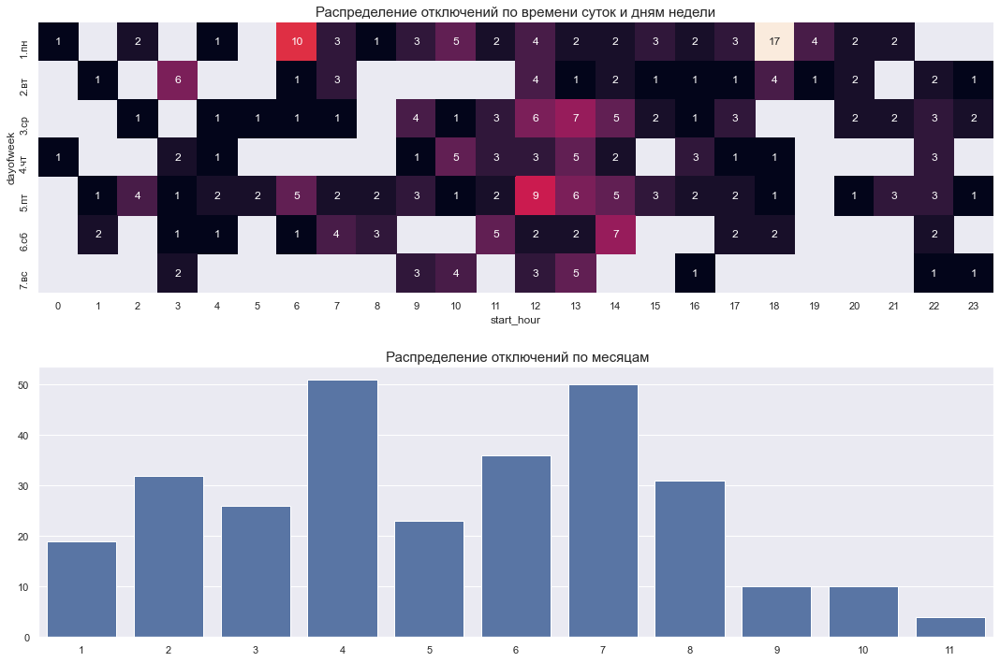

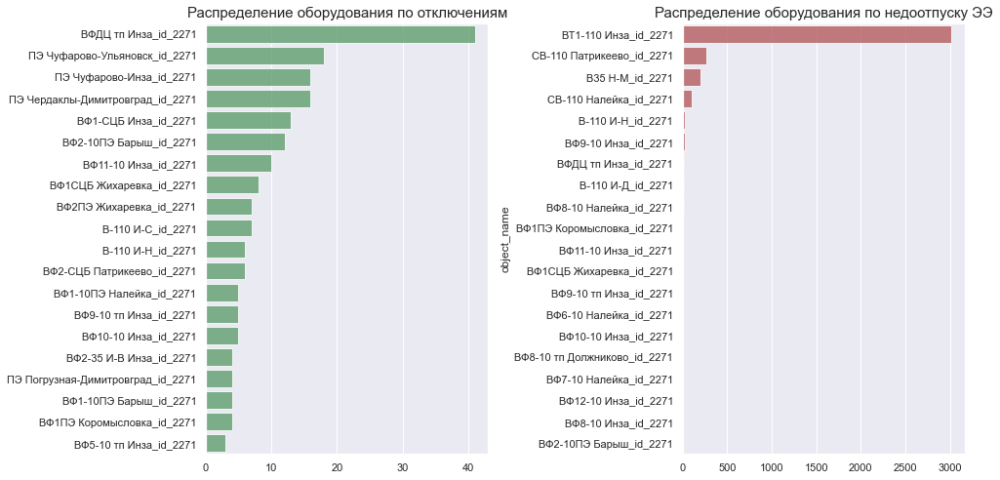

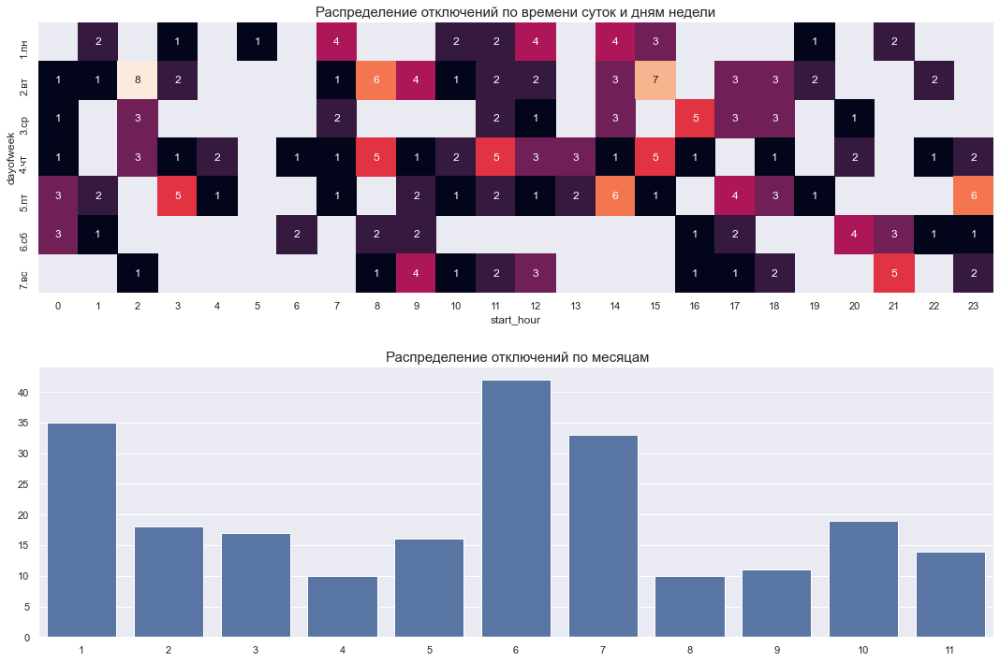

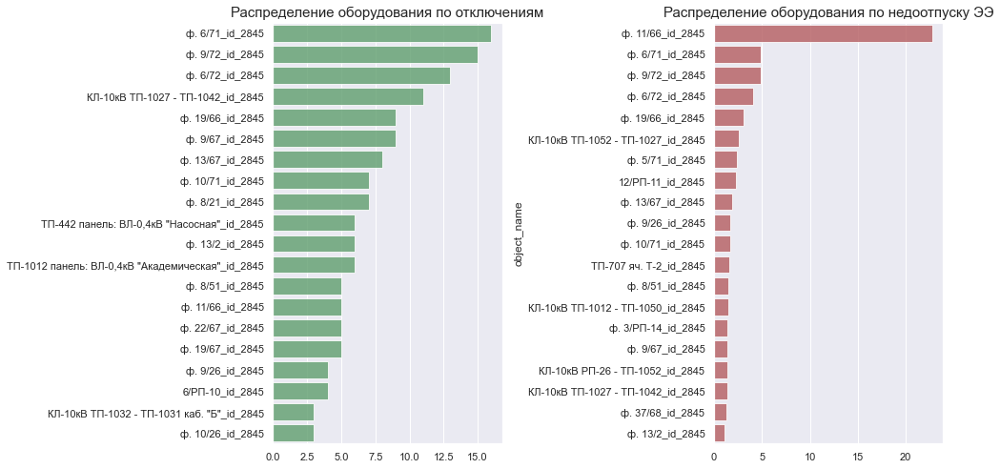

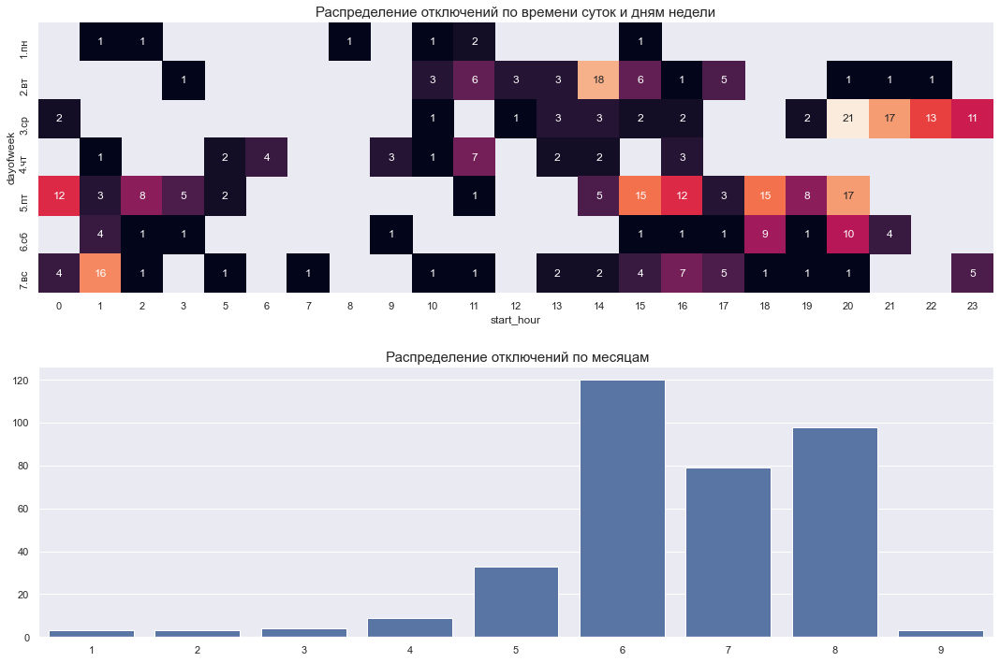

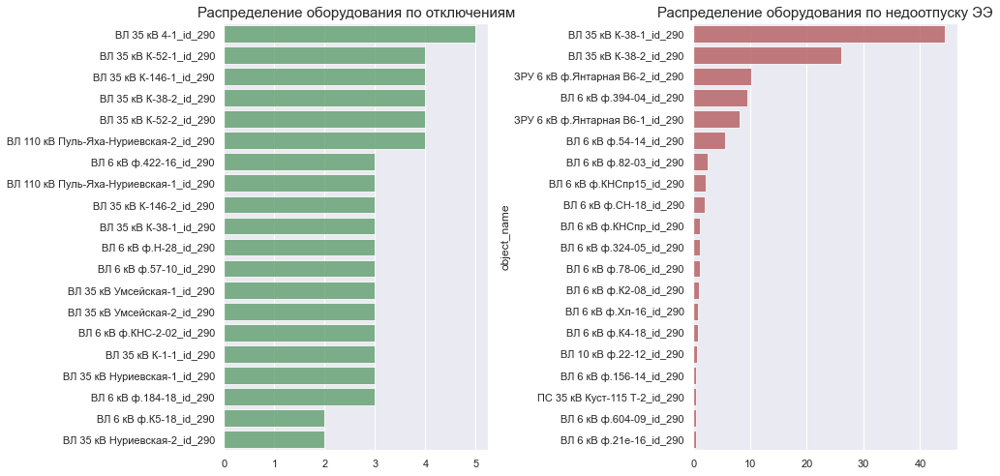

In [290]:
if not os.path.exists(f'Данные_ТСО{YEAR}'):
    os.mkdir(f'Данные_ТСО{YEAR}')



for tso in [TSO_1,TSO_2,TSO_3,TSO_4,]:
    
    os.chdir(f"/Users/denisenko/Desktop/Минэнерго/Отключения - выгрузка/Данные_{YEAR}/Данные_ТСО{YEAR}")
    
    # make file
    if not os.path.exists(f'{tso}'):
        os.mkdir(f'{tso}')
    
    # Эксель с данными по оборудованию: отключения, недоотпуск, причины 
    object_stat_table(tso).to_excel(f'{tso}/Стат_по_оборуд.xlsx')
    print(f'done for {tso}')
    
    # График причин отключений в данном ТСО
    reason_fig = graf_tso_reasons(tso)
    pio.write_image(reason_fig, f'{tso}/ТОП_причин_аварий_{tso}.pdf')
    
    # Графики данных отключений по времени: время суток, дни недели, месяцы
    TSO_stat_by_time(tso).savefig(f'{tso}/Отключения по времени')
    
    # Графики наиболее отключаемого оборудования: по количеству отключений и по недоотпуску
    TSO_object_name(tso).savefig(f'{tso}/Отключения по оборудованию')
    
    # Эксель - матрица корреляций причин отключений
    try: 
        fig_corr_matrix(tso).savefig(f'{tso}/МК_причин_откл.pdf')
        #.to_excel(f'{tso}/МК_причин_откл_.xlsx')
    except:
        print(f'В {tso} \n нет значимых корреляций')
    
    os.chdir(r"/Users/denisenko/Desktop/Минэнерго/Отключения - выгрузка")

### Корреляция параметров ТСО

In [788]:
df_TSO.corr()

,name_TSO,region,id_region,max_points,shotdown_count,sum_duration_hour,sum_power,powerhour,shotdown_count/max_points,sum_duration_hour/max_points,powhour/max_points
0,"АКЦИОНЕРНОЕ ОБЩЕСТВО ""ЭЛС"" (АО ""ЭЛС"")",Смоленская,67,1228,1,0.65,184.76,0.120094,0.000814,0.000529,0.000098
1,"АО ""Дальневосточная распределительная компани...",Хабаровский,27,58076,853,2231.15,791020.40,1602.940090,0.014688,0.038418,0.027601
2,"АО "" Находкинский морской торговый порт""",Приморский,25,28,17,140.62,874.10,3.019688,0.607143,5.022143,0.107846
3,"АО ""Автомобильный завод ""Урал""",Челябинская,74,126,1,0.50,950.00,0.475000,0.007937,0.003968,0.003770
4,"АО ""Алексинская электросетевая компания""",Тульская,71,7022,28,39.16,13024.80,28.219721,0.003987,0.005577,0.004019
...,...,...,...,...,...,...,...,...,...,...,...
926,"филиал ПАО ""МРСК Центра"" - ""Тверьэнерго""",Тверская,69,342103,2781,7057.63,385928.62,822.616489,0.008129,0.020630,0.002405
927,"филиал ПАО ""Россети Волга"" - ""Пензаэнерго""",Пензенская,58,299265,1764,2351.96,194732.21,281.420004,0.005894,0.007859,0.000940
928,"филиал ПАО ""Россети Волга"" - ""Самарские распре...",Самарская,63,212014,1689,2127.78,304411.21,304.657891,0.007966,0.010036,0.001437
929,"филиал ПАО ""Россети Волга""- ""Ульяновские распр...",Ульяновская,73,165318,1321,1460.46,206793.58,233.077826,0.007991,0.008834,0.001410


In [797]:
df_TSO_test = df_TSO.copy()

In [798]:
df_TSO_test['powerhour/acc'] = df_TSO_test['powerhour']/df_TSO_test['shotdown_count']

/Users/denisenko/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



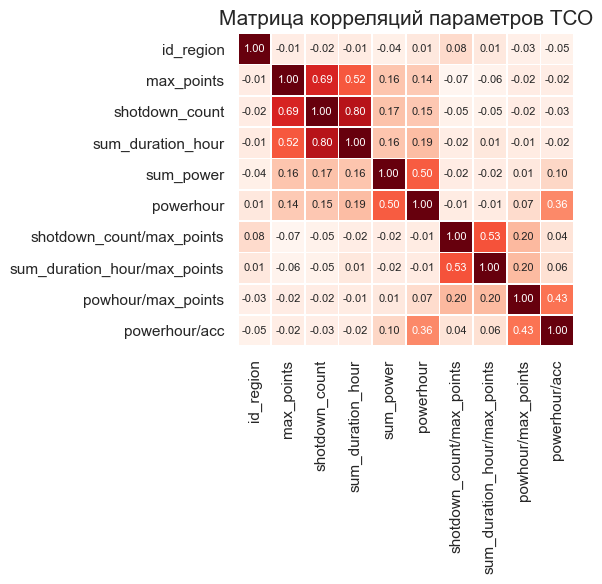

In [799]:
fig_h9 = plt.figure(figsize=(6,6), dpi= 100)

ax_h9 = fig_h9.add_subplot(1, 1, 1)

sns.heatmap(df_TSO_test.corr(), 
            annot=True, fmt='.2f', annot_kws={'fontsize':8}, cmap='Reds', linewidths=0.5, ax=ax_h9, cbar=False)

ax_h9.set_title(f'Матрица корреляций параметров ТСО',fontsize=15)

fig_h9.tight_layout()

fig_h9.show()

/Users/denisenko/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



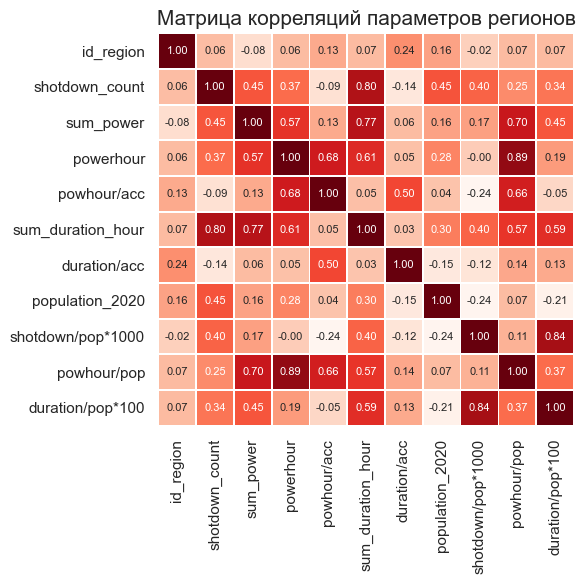

In [795]:
fig_h9 = plt.figure(figsize=(6,6), dpi= 100)

ax_h9 = fig_h9.add_subplot(1, 1, 1)

sns.heatmap(df_region.corr(), 
            annot=True, fmt='.2f', annot_kws={'fontsize':8}, cmap='Reds', linewidths=0.5, ax=ax_h9, cbar=False)

ax_h9.set_title(f'Матрица корреляций параметров регионов',fontsize=15)

fig_h9.tight_layout()

fig_h9.show()